In [ ]:
! pip install ultralytics
! pip install fastprogress

[google colab for this notebook](https://colab.research.google.com/drive/1uVqFIyu5ejkewo1V41ogZrCSywXD5R2Z?usp=sharing)

https://arxiv.org/abs/1506.02640 (yolo paper) <br/>
https://github.com/ultralytics/ultralytics (official lib, yolov8) <br/>
https://docs.ultralytics.com/quickstart/ (official doc) <br/>
https://www.youtube.com/@Ultralytics (official youtube channel) <br/>

https://docs.ultralytics.com/modes/track/ (live object tracking)

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

In [ ]:
# path for colab cv2.imshow
from google.colab.patches import cv2_imshow
import time

In [ ]:
# load basic pre-trained detect model
model = YOLO('yolov8n.pt')

In [ ]:
video_path = "Amazing_Indoor_Koi Pond.mp4"

In [ ]:
# video capture is a helper function to get the frames from video file.
# returns generator object, we can efficiently loop through get the subsequent frames.
cap = cv2.VideoCapture(video_path)

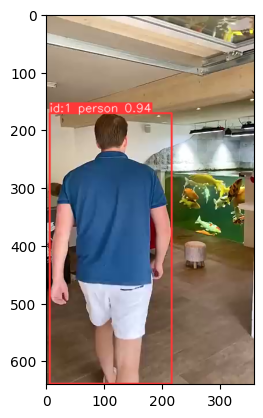

done!


In [ ]:
fig, ax = plt.subplots()
predicted_frames = []
while cap.isOpened():
    res, frame = cap.read()

    if not res:
      print('done!')
      break

    # frame = cv2.resize(frame, (resize_width, resize_height))

    # persist: if True current frame output will be passed to the next frame prediction
    predictions = model.track(frame, persist=True, verbose=False)

    # plot the predictions
    # cv2_imshow(predictions[0].plot())
    img = cv2.cvtColor(predictions[0].plot(), cv2.COLOR_BGR2RGB)
    predicted_frames.append(predictions[0].plot())
    if not hasattr(ax, 'image'):
        ax.image = plt.imshow(img)
        plt.show()
    else:
        ax.image.set_data(img)
        plt.show()


    # break the loop by key press.
    # cv2.waitKey(1) wait for 1 milli second.
    # 0xFF: & 0xFF: This is a bitwise AND operation with the hexadecimal value 0xFF (which is 255 in decimal).
    # this operation is used to extract the least significant 8 bits (or the lowest byte) of the ASCII value.
    # this is necessary because the return value of cv2.waitKey() can be larger than 255,
    # and we are interested only in the lower 8 bits, which correspond to the ASCII value
    # ord(.): integer representation of unicode character of the given character.
    if cv2.waitKey(1) & 0xFF == ord('q'):
      break

# destroy all the memory related to VideoCapture object
cap.release()

# any open windows like image/video display
cv2.destroyAllWindows()


In [ ]:
import numpy as np
import cv2
from IPython.display import Video

# Assuming you have a list of frames where each frame is represented as a NumPy array
# Replace this with your actual list of frames
frames = predicted_frames

# Get the shape of the frames (assuming all frames have the same shape)
height, width, layers = frames[0].shape

# Define the codec and create a VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # You can use other codecs like 'XVID' or 'MJPG'
video_path = "output_video.mp4"
video_writer = cv2.VideoWriter(video_path, fourcc, 10.0, (width, height))

# Write each frame to the video file
for frame in frames:
    video_writer.write(frame)

# Release the VideoWriter object
video_writer.release()

# Display the video in the notebook
Video(video_path, embed=True)
